In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv
import tensorflow as tf
import os

In [2]:
!pip install mtcnn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 9.4 MB/s eta 0:00:00


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
img = cv.imread('/content/drive/MyDrive/FaceNet/My images/IMG-20211130-WA0000.jpg')

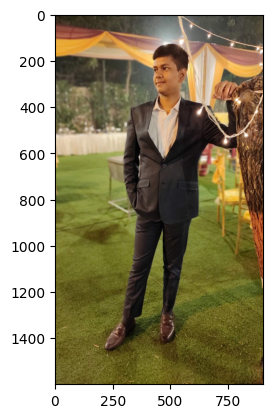

In [5]:
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
plt.imshow(img)

In [6]:
from mtcnn import MTCNN

In [7]:
detector = MTCNN()
result = detector.detect_faces(img)

2/2 [==============================] - 0s 7ms/step


In [48]:
result

[{'box': [418, 182, 113, 154],
  'confidence': 0.9999963641166687,
  'keypoints': {'left_eye': (433, 244),
   'right_eye': (478, 237),
   'nose': (441, 268),
   'mouth_left': (437, 300),
   'mouth_right': (474, 295)}}]

In [9]:
x, y, width, height = result[0]['box']

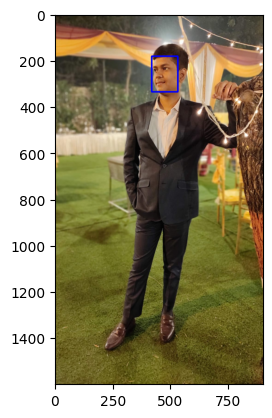

In [10]:
img = cv.rectangle(img, (x, y), (x+width, y+height), (0, 0, 255), 5)
plt.imshow(img)

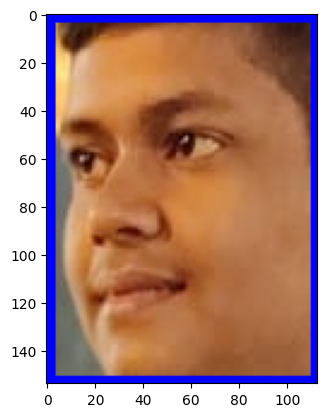

In [11]:
img = img[y:y+height, x:x+width]
plt.imshow(img)


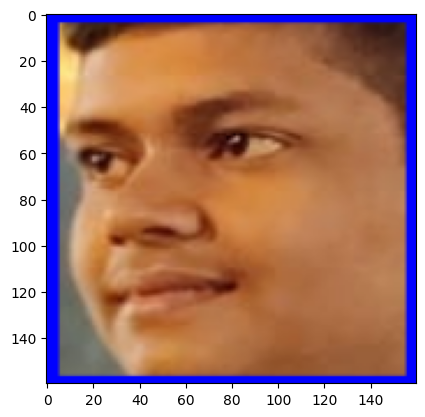

In [12]:
img = cv.resize(img, (160, 160))
plt.imshow(img)

In [13]:
import os
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from mtcnn.mtcnn import MTCNN

class FaceLoading:

    def __init__(self, path):
        self.path = path
        self.target_size = (160, 160)
        self.x = []
        self.y = []
        self.detector = MTCNN()

    def extract_face(self, filename):
        img = cv.imread(filename)
        img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
        result = self.detector.detect_faces(img)

        if result:  # Check if any face is detected
            x, y, width, height = result[0]['box']
            x, y = abs(x), abs(y)
            face = img[y:y + height, x:x + width]
            face = cv.resize(face, self.target_size)
            return face
        return None  # Return None if no face is detected

    def load_faces(self, path):
        faces = []
        for filename in os.listdir(path):
            try:
                file_path = os.path.join(path, filename)
                face = self.extract_face(file_path)
                if face is not None:  # Only append valid faces
                    faces.append(face)
            except Exception as e:
                print(f"Error processing {filename}: {e}")
        return faces

    def load_classes(self):
        for class_name in os.listdir(self.path):
            class_dir = os.path.join(self.path, class_name)
            if os.path.isdir(class_dir):  # Ensure it's a directory
                faces = self.load_faces(class_dir)
                labels = [class_name] * len(faces)  # Create labels for faces
                print(f'Loaded successfully: {len(labels)} for class: {class_name}')
                self.x.extend(faces)
                self.y.extend(labels)

        return np.asarray(self.x), np.asarray(self.y)

    def plot_images(self):
        ncols = 3
        nrows = (len(self.x) + ncols - 1) // ncols  # Compute number of rows needed
        plt.figure(figsize=(15, 5 * nrows))  # Adjust figure size based on rows
        for num, image in enumerate(self.x):
            plt.subplot(nrows, ncols, num + 1)
            plt.imshow(image)
            plt.axis('off')
        plt.tight_layout()
        plt.show()


In [14]:
obj = FaceLoading('/content/drive/MyDrive/FaceNet/')
x, y = obj.load_classes()

1/1 [==============================] - 0s 29ms/step
Loaded successfully: 10 for class: robert_downey
1/1 [==============================] - 0s 30ms/step
Loaded successfully: 10 for class: My images
1/1 [==============================] - 0s 29ms/step
Loaded successfully: 10 for class: taylor_swift
1/1 [==============================] - 0s 28ms/step
Loaded successfully: 10 for class: jenna_ortega


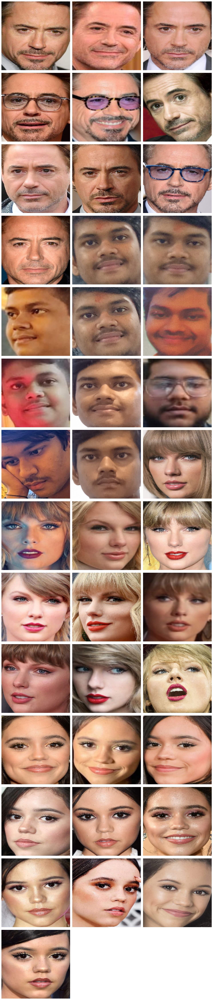

In [17]:
ncols = 3
nrows = (len(x) + ncols - 1) // ncols
plt.figure(figsize=(15, 5 * nrows))  # Adjust figure size based on rows
for num, image in enumerate(x):
  plt.subplot(nrows, ncols, num + 1)
  plt.imshow(image)
  plt.axis('off')
plt.tight_layout()
plt.show()

In [19]:
!pip install keras-facenet


  Preparing metadata (setup.py) ... done
  Created wheel for keras-facenet: filename=keras_facenet-0.3.2-py3-none-any.whl size=10367 sha256=0300ac58090221c0c7b678e1d43d721c9a9d07c116fa71f38e97700c09f54177
  Stored in directory: /root/.cache/pip/wheels/1d/d8/a9/85cf04ea29321d2afcb82c0caaafdca9195385f9d68cbc7185
Successfully built keras-facenet


In [20]:
from keras_facenet import FaceNet

In [21]:
embedder = FaceNet()
def get_embedding(face_img):
    face_img = face_img.astype('float32')
    face_img = np.expand_dims(face_img, axis=0)
    embedding = embedder.embeddings(face_img)
    return embedding[0]

In [22]:
embedded_x = []
for face in x:
  embedded_x.append(get_embedding(face))
embedded_x = np.asarray(embedded_x)

1/1 [==============================] - 0s 55ms/step


In [23]:
np.savez_compressed('embedded_x.npz', embedded_x, y)

In [29]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

In [30]:
encoder = LabelEncoder()
encoder.fit(y)
y = encoder.transform(y)

In [31]:
y

array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

In [32]:
x_train, x_test, y_train, y_test = train_test_split(embedded_x, y, test_size=0.2, random_state=42)

In [33]:
from sklearn.svm import SVC

In [34]:
model = SVC(kernel='linear', probability=True)
model.fit(x_train, y_train)

SVC(kernel='linear', probability=True)

In [35]:
y_train_pred = model.predict(x_train)
y_test_pred = model.predict(x_test)

In [36]:
from sklearn.metrics import accuracy_score

In [37]:
accuracy_score(y_train, y_train_pred)

1.0

In [38]:
accuracy_score(y_test, y_test_pred)

1.0

In [39]:
test_img = cv.imread('/content/drive/MyDrive/FaceNet/My images/IMG-20211130-WA0000.jpg')
test_img = cv.cvtColor(test_img, cv.COLOR_BGR2RGB)
x, y, width, height = result[0]['box']
x, y = abs(x), abs(y)
test_img = test_img[y:y + height, x:x + width]
test_img = cv.resize(test_img, (160, 160))
test = get_embedding(test_img)


1/1 [==============================] - 0s 59ms/step


In [40]:
test.shape

(512,)

In [41]:
test

array([ 0.01826238,  0.01598113, -0.02684636,  0.02627013,  0.0138407 ,
       -0.0173138 ,  0.07273965, -0.009757  , -0.00033425,  0.0477116 ,
        0.00461448, -0.0012593 , -0.04852335, -0.03937022, -0.0408577 ,
        0.04561301,  0.0008355 ,  0.05354012, -0.0025106 ,  0.05141858,
        0.0365537 ,  0.01293107,  0.05694985, -0.00053553,  0.00348348,
        0.02479878,  0.05426449, -0.04849369, -0.02933849, -0.0147056 ,
        0.05017704,  0.03202162, -0.03449187,  0.01258628,  0.06714407,
       -0.01190171,  0.04531953, -0.05216094,  0.03032685, -0.00707161,
        0.02476373, -0.03916933, -0.01255289, -0.00068204, -0.02459524,
       -0.00923589, -0.11653884, -0.03042219, -0.01632798,  0.06451102,
        0.01742702, -0.09018933, -0.05053927,  0.02527588, -0.0795663 ,
       -0.06795565, -0.00158869, -0.04541638, -0.01705246,  0.03455489,
        0.02592351,  0.05679195,  0.00123755,  0.07149082, -0.02565498,
       -0.04487079,  0.00736199, -0.07938742,  0.06589565, -0.02

In [42]:
test = [test]
pred = model.predict(test)

In [43]:
pred

array([0])

In [44]:
encoder.inverse_transform(pred)

array(['My images'], dtype='<U13')

In [46]:
import pickle

In [47]:
filename = 'svm_model.sav'
pickle.dump(model, open(filename, 'wb'))
